In [2]:
# Bringing in tensorflow and limiting VRAM growth
!pip install tensorflow

import tensorflow as tf
tf.get_logger().setLevel('INFO')

gpus = tf.config.experimental.list_physical_devices("GPU")
for gpu in gpus:
    print(gpu)
    tf.config.experimental.set_memory_growth(gpu, True)

In [3]:
data_path = "/Users/jiali/Downloads/Portraits/"


In [4]:
batch_size = 64
image_height = 64
image_width = 64



In [5]:
ds =  tf.keras.utils.image_dataset_from_directory(
    data_path,
    label_mode=None,  
    image_size= (image_height, image_width),
    batch_size=batch_size
)

Found 4117 files.


In [6]:
# Function to display images
def show_images(data):
    
    plt.figure(figsize = (16, 16))
    
    for images in data.take(1): # grab one batch
        for idx in range(24): # grab X*Y samples
            plt.subplot(6, 6, idx + 1)
            plt.imshow(images[idx].numpy().astype("uint8"))
            plt.axis("off")
            #plt.subplots_adjust(top = 1, bottom = 0, right = 1, left = 0, hspace = 0, wspace = 0)

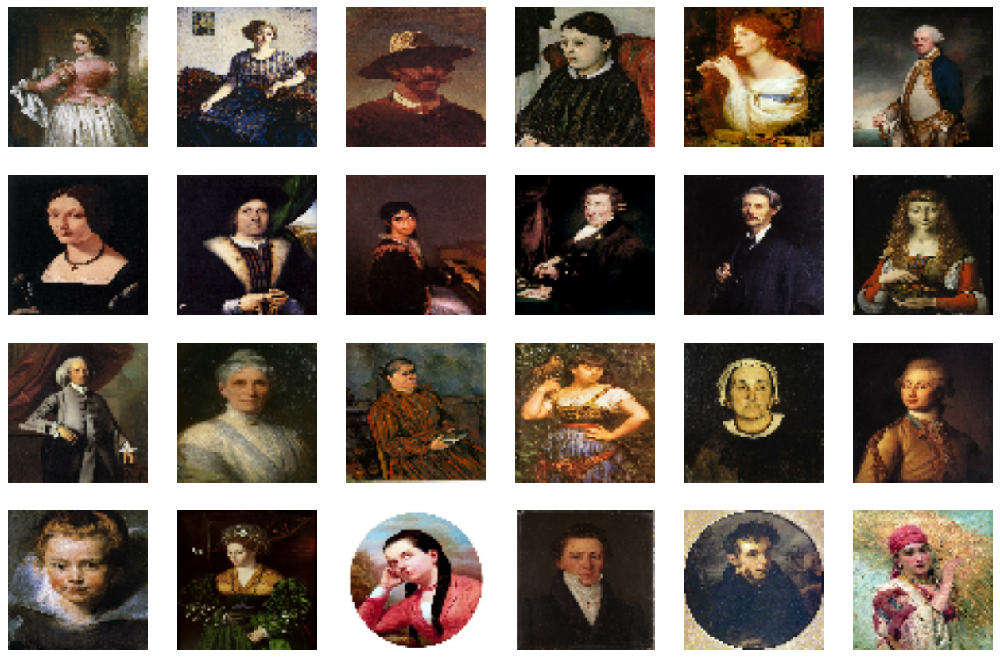

In [23]:
import numpy as np
from matplotlib import pyplot as plt

# Display dataset
show_images(ds)

In [7]:
# Data processing

# MCSBP process (map, cache, shuffle, batch, prefetch)

# map: scale values to be between 0 and 1
ds = ds.map(lambda x: x / 255.0)

In [8]:
# Importing modelling components

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, Dense, Flatten, Activation, ZeroPadding2D, UpSampling2D, Conv2DTranspose, BatchNormalization, Reshape, LeakyReLU, Dropout

In [9]:
# Build generator

latent_dim = 128

generator = Sequential()

# Block 1
generator.add(Dense(4*4*256, input_dim = latent_dim))
generator.add(Activation("relu"))
generator.add(Reshape((4, 4, 256)))

# Block 2
generator.add(UpSampling2D())
generator.add(Conv2D(256, 3, padding = "same"))
#generator.add(Conv2DTranspose(128, 3, 2, padding = "same"))
generator.add(BatchNormalization(momentum = 0.8))
generator.add(Activation("relu"))

# Block 3
generator.add(UpSampling2D())
generator.add(Conv2D(256, 3, padding = "same"))
#generator.add(Conv2DTranspose(128, 3, 2, padding = "same"))
generator.add(BatchNormalization(momentum = 0.8))
generator.add(Activation("relu"))

# Block 4
generator.add(UpSampling2D())
generator.add(Conv2D(256, 3, padding = "same"))
#generator.add(Conv2DTranspose(128, 3, 2, padding = "same"))
generator.add(BatchNormalization(momentum = 0.8))
generator.add(Activation("relu"))

# Block 5
generator.add(UpSampling2D())
generator.add(Conv2D(128, 3, padding = "same"))
#generator.add(Conv2DTranspose(128, 3, 2, padding = "same"))
generator.add(BatchNormalization(momentum = 0.8))
generator.add(Activation("relu"))

generator.add(Conv2D(3, 3, padding = "same"))
generator.add(Activation("sigmoid"))

generator.summary()

C:\Users\jiali\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:86: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 4096)           │       528,384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d (UpSampling2D)    │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 8, 8, 256)      │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 8, 8, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_1 (UpSampling2D)  │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 16, 16, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_2 (UpSampling2D)  │ (None, 32, 32, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 32, 32, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 32, 32, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 32, 32, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_3 (UpSampling2D)  │ (None, 64, 64, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 64, 64, 128)    │       295,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 64, 64, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_4 (Activation)       │ (None, 64, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 64, 64, 3)      │         3,459 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_5 (Activation)       │ (None, 64, 64, 3)      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,600,707 (9.92 MB)

 Trainable params: 2,598,915 (9.91 MB)

 Non-trainable params: 1,792 (7.00 KB)

In [10]:
# Use the untrained generator to generate four images (random)

random_latent_vectors = tf.random.uniform((4, latent_dim))
generated_images = generator(random_latent_vectors, training = False)
generated_images.shape

TensorShape([4, 64, 64, 3])

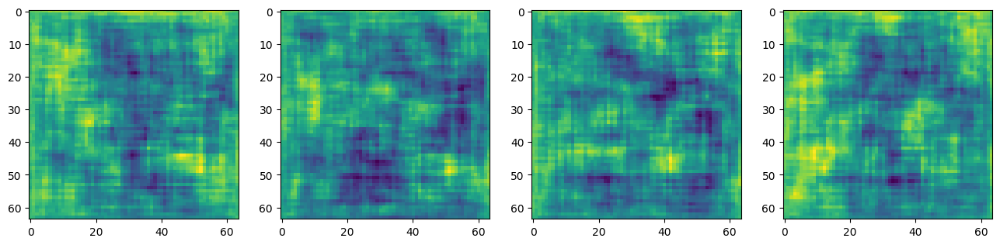

In [30]:
# Visualising generated images without training

fig, ax = plt.subplots(ncols = 4, figsize = (16, 16))
for idx, img in enumerate(generated_images):
    ax[idx].imshow(img[:, :, 0])

In [11]:
# Build discriminator

discriminator = Sequential()

# Block 1
# Same output shape as our generator
discriminator.add(Conv2D(32, 3, 2, input_shape = (64, 64, 3), padding = "same"))
discriminator.add(LeakyReLU(alpha = 0.2))
# making it a little bit harder for our discriminator to learn
discriminator.add(Dropout(0.25))

# Block 2
discriminator.add(Conv2D(64, 3, 2, padding = "same"))
discriminator.add(ZeroPadding2D(padding = ((0,1),(0,1))))
discriminator.add(BatchNormalization(momentum = 0.8))
discriminator.add(LeakyReLU(alpha = 0.2))
discriminator.add(Dropout(0.25))

# Block 3
discriminator.add(Conv2D(128, 3, 2, padding = "same"))
discriminator.add(BatchNormalization(momentum = 0.8))
discriminator.add(LeakyReLU(alpha = 0.2))
discriminator.add(Dropout(0.25))

# Block 4
discriminator.add(Conv2D(256, 3, 1, padding = "same"))
discriminator.add(BatchNormalization(momentum = 0.8))
discriminator.add(LeakyReLU(alpha = 0.2))
discriminator.add(Dropout(0.25))

# Block 5
discriminator.add(Conv2D(512, 3, 1, padding = "same"))
discriminator.add(BatchNormalization(momentum = 0.8))
discriminator.add(LeakyReLU(alpha = 0.2))
discriminator.add(Dropout(0.25))

# Flatten then pass to dense layer
discriminator.add(Flatten())

# 1 = Fake image, 0 = True image
discriminator.add(Dense(1, activation = 'sigmoid'))

discriminator.summary()

C:\Users\jiali\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(
C:\Users\jiali\anaconda3\Lib\site-packages\keras\src\layers\activations\leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_5 (Conv2D)               │ (None, 32, 32, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 32, 32, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 32, 32, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 16, 16, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ zero_padding2d (ZeroPadding2D)  │ (None, 17, 17, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 17, 17, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 17, 17, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 17, 17, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 9, 9, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 9, 9, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 9, 9, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 9, 9, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 9, 9, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 9, 9, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ (None, 9, 9, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 9, 9, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 9, 9, 512)      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 9, 9, 512)      │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_4 (LeakyReLU)       │ (None, 9, 9, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 9, 9, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 41472)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │        41,473 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,613,889 (6.16 MB)

 Trainable params: 1,611,969 (6.15 MB)

 Non-trainable params: 1,920 (7.50 KB)

In [32]:
# Classify a random generated image with the untrained discriminator
#   the prediction will likely be 50%

random_latent_vector = tf.random.uniform((1, latent_dim))
generated_image = generator(random_latent_vector, training = False)
print(discriminator(generated_image))

tf.Tensor([[0.49779174]], shape=(1, 1), dtype=float32)


In [33]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import BinaryCrossentropy

g_opt = Adam(learning_rate = 1.2e-4, beta_1 = 0.5) 
d_opt = Adam(learning_rate = 1e-4, beta_1 = 0.5)

g_loss_fn = BinaryCrossentropy()
d_loss_fn = BinaryCrossentropy()

In [34]:
# Import base model class to subclass our training step

from tensorflow.keras.models import Model

# We need to define three key methods when subclassing 
#   from the Model class: init, train (.fit), and compile
class ArtGAN(Model):
    
    def __init__(self, generator, discriminator, latent_dim):
        super(ArtGAN, self).__init__()

        self.generator = generator
        self.discriminator = discriminator
        self.latent_dim = latent_dim

    # Compile with base class
    def compile(self, g_opt, d_opt, g_loss_fn, d_loss_fn):
        super(ArtGAN, self).compile()

        self.g_opt = g_opt
        self.d_opt = d_opt
        
        self.g_loss_fn = g_loss_fn
        self.d_loss_fn = d_loss_fn
        
        self.g_loss_metric = tf.keras.metrics.Mean(name = "g_loss")
        self.d_loss_metric = tf.keras.metrics.Mean(name = "d_loss")
        
    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]
    
    # Called when we call .fit function
    # batch = real images
    def train_step(self, batch):

        # Get data
        batch_size = tf.shape(batch)[0]
        real_images = batch
        
        # Generate batch_size images, so we have same number of images in real and fake batch
        random_latent_vectors = tf.random.normal((batch_size, self.latent_dim))
        fake_images = self.generator(random_latent_vectors)
        
        # Combined images
        combined_images = tf.concat([fake_images, real_images], axis = 0)
        
        # Create labels for real and fake images
        # At the moment it is a supervised learning problem (fake or not fake)
        # Effectively, batch_size zeros (real) and batch_size ones (fake)
        # actual labels
        labels = tf.concat([tf.ones((batch_size, 1)), tf.zeros((batch_size, 1))], axis = 0)

        # Add noise to labels
        labels += 0.05 * tf.random.uniform(tf.shape(labels))
        
        # Train discriminator
        with tf.GradientTape() as d_tape:
            
            # Discriminator predictions   
            predictions = self.discriminator(combined_images)
            
            # Calculate loss - BinaryCrossentropy
            d_loss = self.d_loss_fn(labels, predictions)

        # Apply backpropagation - NN learn
        # Calculate gradient for each one of our trainable variables with respect to our loss
        dgrad = d_tape.gradient(d_loss, self.discriminator.trainable_variables) 
        
        # Apply gradients using our optimizer
        self.d_opt.apply_gradients(zip(dgrad, self.discriminator.trainable_variables))
        
        # -------------------------------------------------------------------------------
        
        # Generate new images
        random_latent_vectors = tf.random.normal((batch_size, self.latent_dim))
        
        # Since we are trying to trick our discriminator, what we are going to do 
        #   is set the variables for our generator to zero. In other words, we want 
        #   our discriminator to think that the generated images are real images

        # Create misleading labels (all real images)
        misleading_labels = tf.zeros((batch_size, 1))
        
        # Train generator
        with tf.GradientTape() as g_tape:
            
            # Create the predicted labels
            predictions = self.discriminator(self.generator(random_latent_vectors))
            
            # Calculate loss - BinaryCrossentropy - trick using misleading_labels 
            g_loss = self.g_loss_fn(misleading_labels, predictions)
            
        # Apply backpropagation - NN learn
        # Calculate gradient for each one of our trainable variables with respect to our loss
        ggrad = g_tape.gradient(g_loss, self.generator.trainable_variables) 
        
        # Apply gradients using our optimizer
        self.g_opt.apply_gradients(zip(ggrad, self.generator.trainable_variables))
        
        # Update
        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)

        return {"d_loss": self.d_loss_metric.result(), "g_loss": self.g_loss_metric.result()}

In [35]:
# number of epochs
epochs = 150

# instance of subclassed model
model = ArtGAN(generator = generator, discriminator = discriminator, latent_dim = latent_dim)

# Compile the model
model.compile(g_opt = g_opt, d_opt = d_opt, g_loss_fn = g_loss_fn, d_loss_fn = d_loss_fn)

In [36]:
!rm -r images/
!mkdir images/

'rm' is not recognized as an internal or external command,
operable program or batch file.
The syntax of the command is incorrect.


In [37]:
import os
from tensorflow.keras.preprocessing.image import array_to_img
from tensorflow.keras.callbacks import Callback

# Callback to save generated image on epoch end
class ModelMonitor(Callback):
    def __init__(self, num_img = 1, latent_dim = latent_dim):
        self.num_img = num_img
        self.latent_dim = latent_dim

    # Saving generated image at the end of each epoch 
    def on_epoch_end(self, epoch, logs = None):
        random_latent_vectors = tf.random.uniform((self.num_img, self.latent_dim))
        generated_images = self.model.generator(random_latent_vectors)
        generated_images *= 255
        generated_images.numpy()
        for i in range(self.num_img):
            img = array_to_img(generated_images[i])
            img.save(os.path.join('images', f'generated_img_{epoch}.png'))

In [38]:
hist = model.fit(ds, epochs = epochs, callbacks=[ModelMonitor()])


Epoch 1/150
65/65 ━━━━━━━━━━━━━━━━━━━━ 393s 6s/step - d_loss: 0.6071 - g_loss: 0.9305
Epoch 2/150
65/65 ━━━━━━━━━━━━━━━━━━━━ 396s 6s/step - d_loss: 0.6021 - g_loss: 1.1588
Epoch 3/150
65/65 ━━━━━━━━━━━━━━━━━━━━ 349s 5s/step - d_loss: 0.6882 - g_loss: 0.7556
Epoch 4/150
65/65 ━━━━━━━━━━━━━━━━━━━━ 345s 5s/step - d_loss: 0.6378 - g_loss: 1.1654
Epoch 5/150
65/65 ━━━━━━━━━━━━━━━━━━━━ 21419s 335s/step - d_loss: 0.6540 - g_loss: 0.8572
Epoch 6/150
65/65 ━━━━━━━━━━━━━━━━━━━━ 448s 7s/step - d_loss: 0.6793 - g_loss: 0.8832
Epoch 7/150
65/65 ━━━━━━━━━━━━━━━━━━━━ 510s 7s/step - d_loss: 0.6573 - g_loss: 0.8480
Epoch 8/150
65/65 ━━━━━━━━━━━━━━━━━━━━ 486s 7s/step - d_loss: 0.6734 - g_loss: 0.8892
Epoch 9/150
65/65 ━━━━━━━━━━━━━━━━━━━━ 454s 7s/step - d_loss: 0.6548 - g_loss: 0.8502
Epoch 10/150
65/65 ━━━━━━━━━━━━━━━━━━━━ 457s 7s/step - d_loss: 0.6922 - g_loss: 0.8274
Epoch 11/150
65/65 ━━━━━━━━━━━━━━━━━━━━ 432s 7s/step - d_loss: 0.6755 - g_loss: 0.7890
Epoch 12/150
65/65 ━━━━━━━━━━━━━━━━━━━━ 389s 6s/

65/65 ━━━━━━━━━━━━━━━━━━━━ 345s 5s/step - d_loss: 0.5242 - g_loss: 1.3333
Epoch 136/150
65/65 ━━━━━━━━━━━━━━━━━━━━ 331s 5s/step - d_loss: 0.5170 - g_loss: 1.4156
Epoch 137/150
65/65 ━━━━━━━━━━━━━━━━━━━━ 327s 5s/step - d_loss: 0.5127 - g_loss: 1.3263
Epoch 138/150
65/65 ━━━━━━━━━━━━━━━━━━━━ 326s 5s/step - d_loss: 0.5273 - g_loss: 1.3607
Epoch 139/150
65/65 ━━━━━━━━━━━━━━━━━━━━ 335s 5s/step - d_loss: 0.5264 - g_loss: 1.4854
Epoch 140/150
65/65 ━━━━━━━━━━━━━━━━━━━━ 362s 5s/step - d_loss: 0.5071 - g_loss: 1.4190
Epoch 141/150
65/65 ━━━━━━━━━━━━━━━━━━━━ 354s 5s/step - d_loss: 0.5008 - g_loss: 1.3761
Epoch 142/150
65/65 ━━━━━━━━━━━━━━━━━━━━ 405s 6s/step - d_loss: 0.5082 - g_loss: 1.4351
Epoch 143/150
65/65 ━━━━━━━━━━━━━━━━━━━━ 394s 6s/step - d_loss: 0.4894 - g_loss: 1.3942
Epoch 144/150
65/65 ━━━━━━━━━━━━━━━━━━━━ 382s 6s/step - d_loss: 0.4963 - g_loss: 1.4382
Epoch 145/150
65/65 ━━━━━━━━━━━━━━━━━━━━ 386s 6s/step - d_loss: 0.4962 - g_loss: 1.4967
Epoch 146/150
65/65 ━━━━━━━━━━━━━━━━━━━━ 399s 

C:\Users\jiali\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\jiali\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 1.0, 'Model Learning Curve')

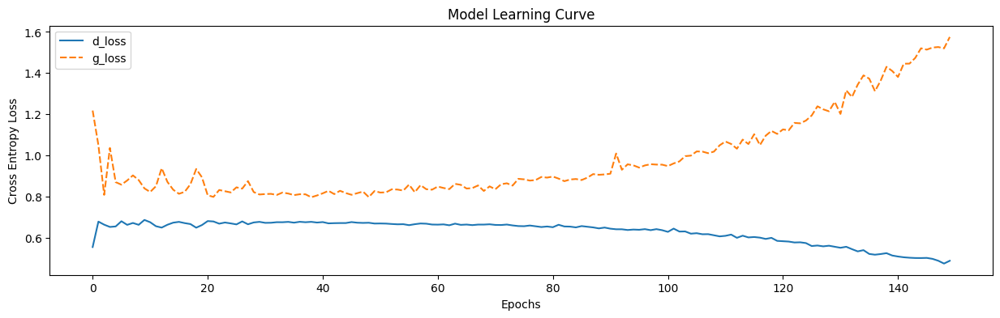

In [39]:
# Plot learning curve

import seaborn as sns
import pandas as pd

history_df = pd.DataFrame(hist.history)
fig = plt.figure(figsize = (15,4))
ax = sns.lineplot(data = history_df)
ax.set(xlabel ="Epochs")
ax.set(ylabel ="Cross Entropy Loss")
ax.set_title("Model Learning Curve")

In [40]:
!rm -r generated_portraits
!mkdir generated_portraits

'rm' is not recognized as an internal or external command,
operable program or batch file.


In [41]:
# Loading pre trained model
#generator.load_weights('generator.h5')

# Generating N images 
N = 36

def art_generator(n_images):
    random_latent_vectors = tf.random.normal((N, latent_dim))
    generated_images = generator(random_latent_vectors)
    generated_images *= 255
    generated_images.numpy()
    
    for i in range(n_images):
        img = tf.keras.preprocessing.image.array_to_img(generated_images[i])
        img.save("generated_portraits/Potraits{:02d}.png".format(i)) 
        
art_generator(N)

Found 36 files.


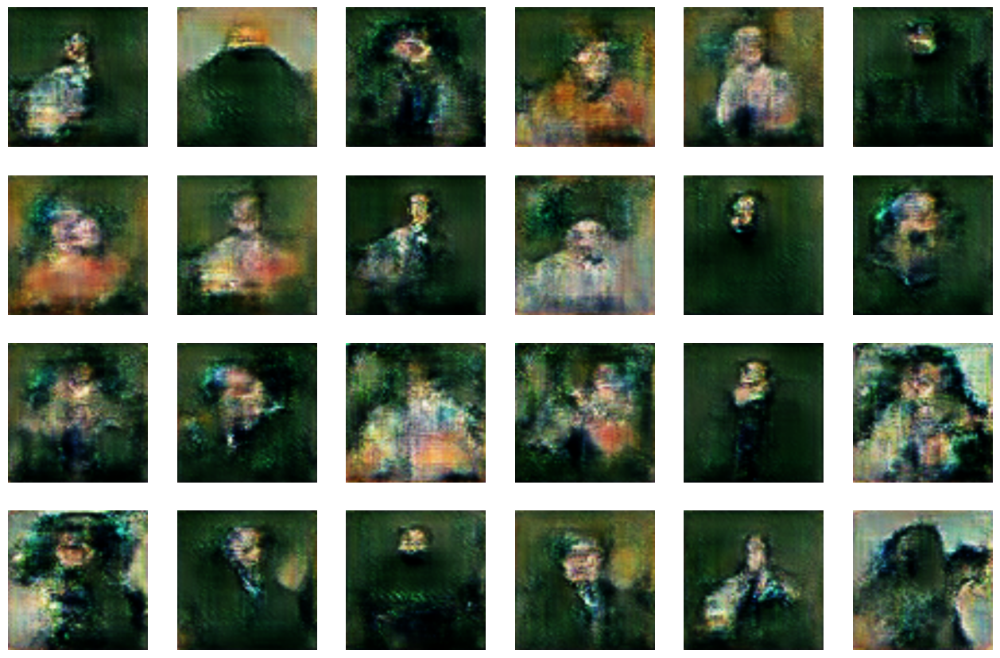

In [42]:
# Loading generated images
generated_path = "./generated_portraits/"
generated_data = tf.keras.preprocessing.image_dataset_from_directory(generated_path, label_mode = None)

# Visualising generated images
show_images(generated_data)

In [45]:
!pip -q install git+https://github.com/tensorflow/docs
!pip install tensorflow-docs


  ERROR: Error [WinError 2] 系统找不到指定的文件。 while executing command git version
ERROR: Cannot find command 'git' - do you have 'git' installed and in your PATH?


  Obtaining dependency information for tensorflow-docs from https://files.pythonhosted.org/packages/e8/72/b7399b0f818559d252a109f43ea436697b31aceaacfda05cb4a7098fdf4b/tensorflow_docs-2024.2.5.73858-py3-none-any.whl.metadata
  Obtaining dependency information for astor from https://files.pythonhosted.org/packages/c3/88/97eef84f48fa04fbd6750e62dcceafba6c63c81b7ac1420856c8dcc0a3f9/astor-0.8.1-py2.py3-none-any.whl.metadata
   ---------------------------------------- 0.0/182.5 kB ? eta -:--:--
   -- ------------------------------------- 10.2/182.5 kB ? eta -:--:--
   ------ -------------------------------- 30.7/182.5 kB 435.7 kB/s eta 0:00:01
   --------------------------------- ------ 153.6/182.5 kB 1.1 MB/s eta 0:00:01
   ---------------------------------------- 182.5/182.5 kB 1.4 MB/s eta 0:00:00



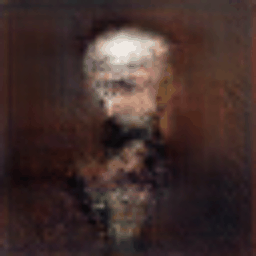

In [46]:
# Creating animated gif for all epochs

import PIL
import imageio.v2 as imageio
import tensorflow_docs.vis.embed as embed
import glob
import cv2

anim_file = "artgan.gif"

with imageio.get_writer(anim_file, mode = "I") as writer:
    filenames = glob.glob("images/" + f'generated_img_*.png')
    filenames = sorted(filenames)
    
    for filename in filenames:
        image = imageio.imread(filename)
        # Resizing image (optional: 64x64 to 256x256)
        image = cv2.resize(image, (256, 256))
        writer.append_data(image)
        
    image = imageio.imread(filename)
    writer.append_data(image)
    

embed.embed_file(anim_file)

In [47]:
generator.save("generator.h5")
discriminator.save("discriminator.h5")

In [48]:
# Creating generated images zip (generated images for each epoch)
import shutil

shutil.make_archive("images", "zip", "./images")

'C:\\Users\\jiali\\Downloads\\images.zip'

In [13]:
!pip install diffusers

import PIL
import imageio.v2 as imageio
import tensorflow as tf
import tensorflow_docs.vis.embed as embed
import glob
import cv2
from diffusers import DiffusionPipeline
import torch

# Function to save images generated by the DiffusionPipeline
def save_generated_images(outputs, save_dir):
    for i, image in enumerate(outputs):
        print(type(image))  # Add this line to check the data type
        pil_image = PIL.Image.fromarray(image)
        pil_image.save(f"{save_dir}/generated_img_{i:03d}.png")
# Check if CUDA is available and set device accordingly
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

# Load DiffusionPipeline
pipe = DiffusionPipeline.from_pretrained("anton-l/ddpm-butterflies-128")
pipe.to(device)

# Generate images using DiffusionPipeline and save them
outputs = []
for i in range(4):
    generator = torch.Generator(device=device).manual_seed(i)
    images = pipe(generator=generator).images
    outputs += images

# Save generated images
save_generated_images(outputs, "images")

# Create animated GIF
anim_file = "artgan.gif"

with imageio.get_writer(anim_file, mode="I") as writer:
    filenames = glob.glob("images/" + f'generated_img_*.png')
    filenames = sorted(filenames)

    for filename in filenames:
        image = imageio.imread(filename)
        # Resizing image (optional: 64x64 to 256x256)
        image = cv2.resize(image, (256, 256))
        writer.append_data(image)

    image = imageio.imread(filename)
    writer.append_data(image)

# Display the animated GIF
embed.embed_file(anim_file)

# Cleanup
del pipe


# Load images from directory
data_path = "/Users/jiali/Downloads/Portraits/"
batch_size = 64
image_height = 64
image_width = 64

ds = tf.keras.utils.image_dataset_from_directory(
    data_path,
    label_mode=None,
    image_size=(image_height, image_width),
    batch_size=batch_size
)

# Confirm the number of files found
num_files = len(ds.file_paths)
print(f"Found {num_files} files")


Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.


Loading pipeline components...:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

<class 'PIL.Image.Image'>


TypeError: a bytes-like object is required, not 'Image'